In [2]:
import matplotlib.pyplot as plt
import numpy as np
import json
import os
import matplotlib.image as mpimg
import matplotlib.patches as patches
from utils import train_transforms, get_boxes_from_mask, init_point_sampling
import cv2
from matplotlib.patches import Rectangle



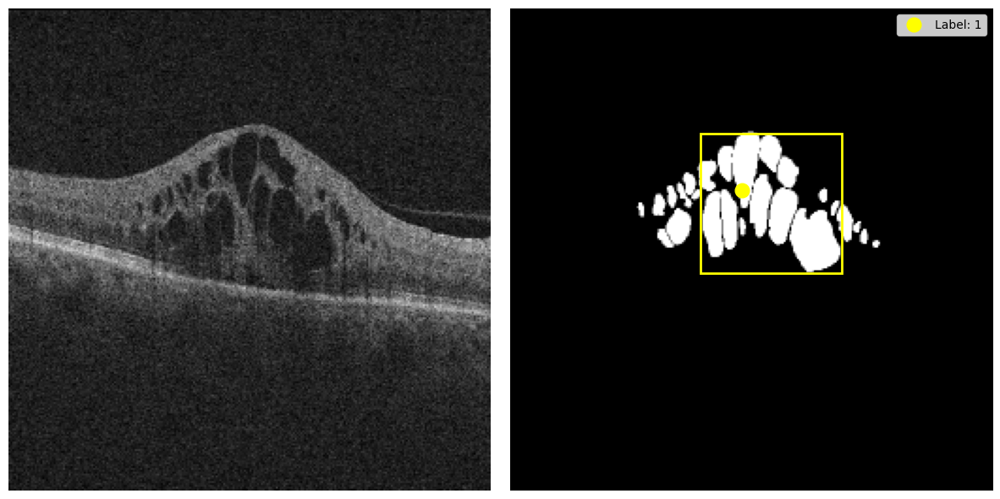

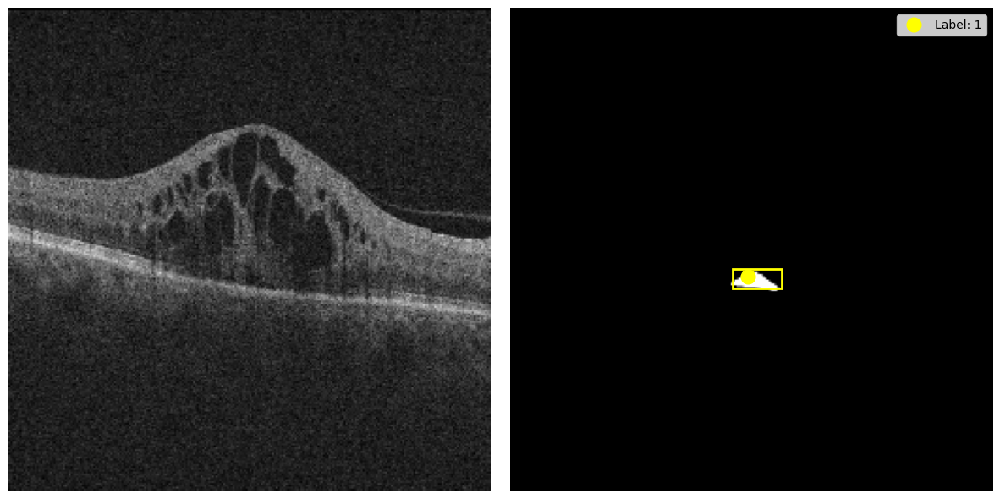

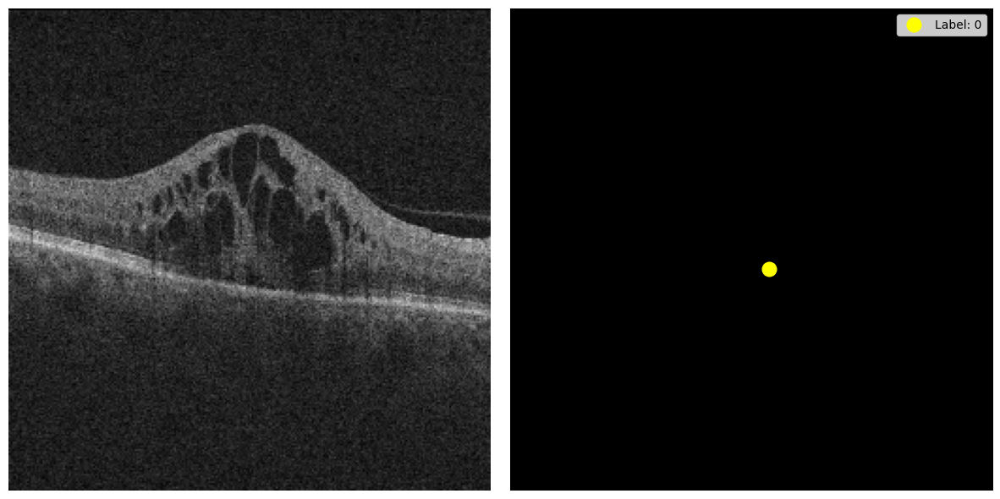

In [14]:
# this file goes through the images, masks and prompts from the json file and plots them with the bounding boxes and points.

# Load image-to-label mapping JSON
with open('../SAM-Med2D/data/label2image_test.json', 'r') as file:
    label_to_image_data = json.load(file)

# Load image information JSON
with open('../SAM-Med2D/workdir/oct_inference_with_adapter/256_prompt.json', 'r') as file:
    prompt_info_data = json.load(file)

# Loop through each image in the image information JSON
for mask_name, mask_info in prompt_info_data.items():

    # Load mask
    mask_path = os.path.join('../SAM-Med2D/data/test/masks', mask_name)
    msk = mpimg.imread(mask_path)
    msk = cv2.resize(msk, (256, 256))

    # Load corresponding image
    img_file = mask_name.split('_oct_')[0] + '_oct_' + mask_name.split('_oct_')[1].split('_')[0] + '.png'
    img_path = os.path.join('../SAM-Med2D/data/test/images', img_file)
    img = mpimg.imread(img_path)
    img = cv2.resize(img, (256, 256))

    # Create subplots with one row and two columns
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))


    if img_file == 'TRAIN008_oct_70.png':
        # Plot the corresponding image
        ax1.imshow(img)
        ax1.axis('off')  # This removes the axes, including ticks, labels, and the frame
        # ax1.set_title(f"{img_file} - Image") # This sets the title of the subplot
    
        # Plot the mask
        ax2.imshow(msk)
        ax1.axis('off')   # This removes the axes, including ticks, labels, and the frame
        # ax2.set_title(f"{mask_name} - Mask") # This sets the title of the subplot
    
        # Plot bounding box if available
        if mask_info["boxes"][0] != [0.0, 0.0, 0.0, 0.0]:
            box = mask_info["boxes"][0]
            rect = Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], linewidth=2, edgecolor='yellow' ,facecolor='none')
            ax2.add_patch(rect)
    
        # Plot point coordinates and labels
        points = mask_info["point_coords"]
        labels = mask_info["point_labels"]
        for point, label_point in zip(points, labels):
            ax2.plot(point[0], point[1], 'o', markersize=12, label=f'Label: {label_point}', color = 'yellow')
    
        # Add legend to mask subplot
        ax2.legend()
        ax2.axis('off')
    
        # Show the plot
        plt.tight_layout()
        plt.show()
    plt.close(fig)
    
    
    

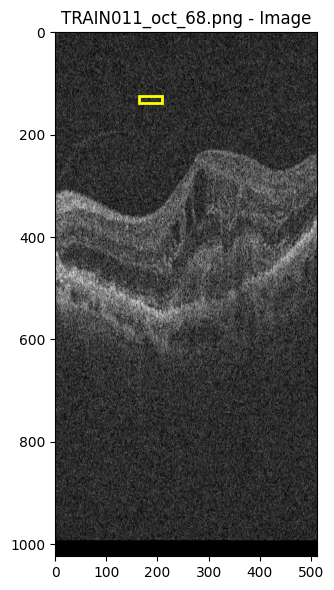

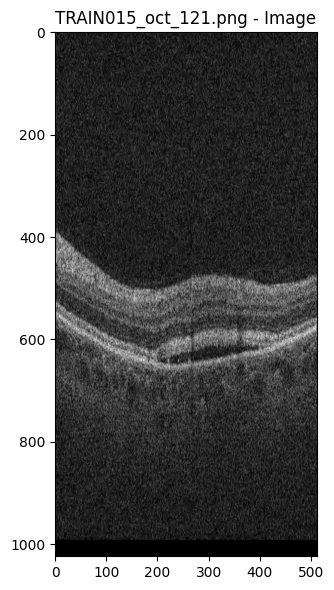

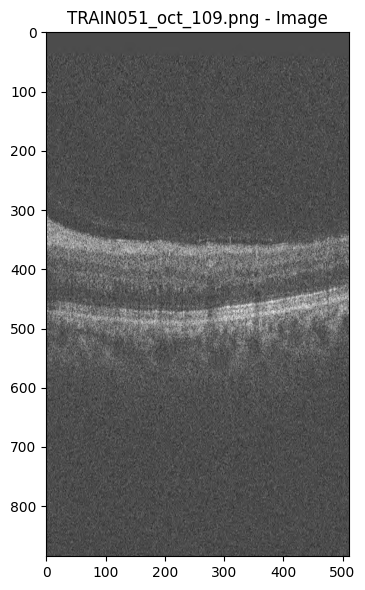

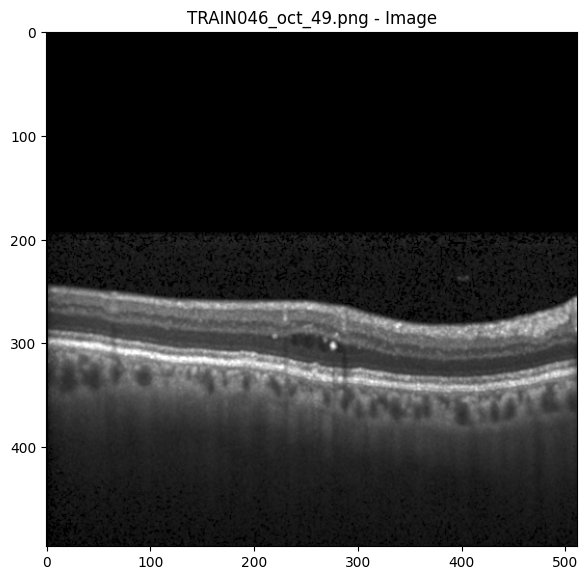

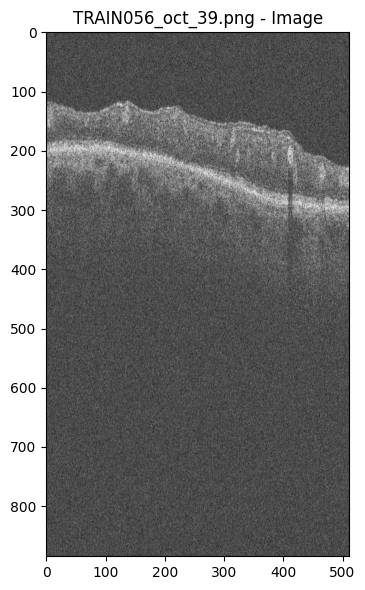

...

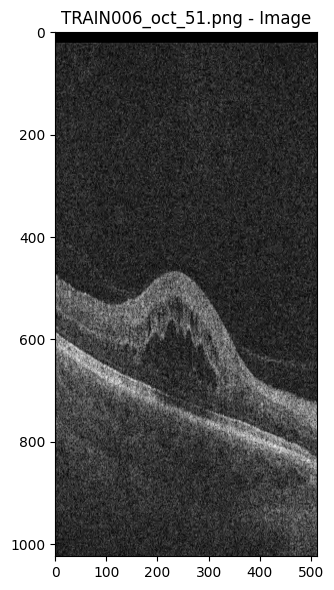

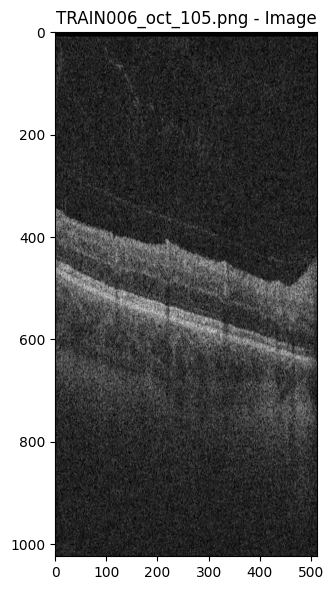

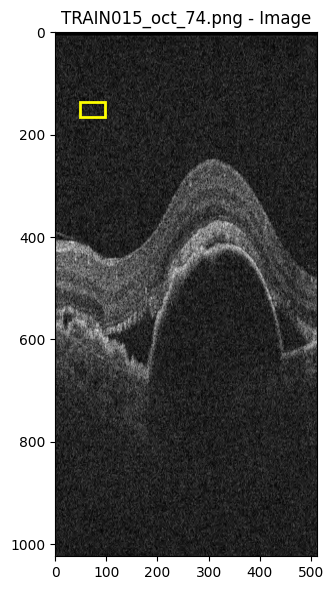

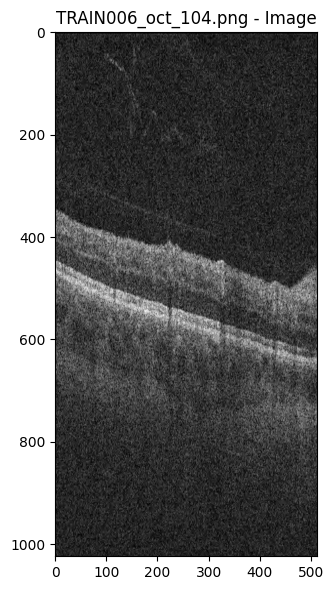

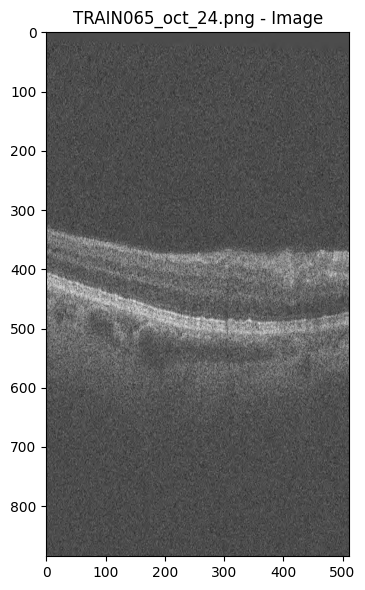

KeyboardInterrupt: 

<Figure size 600x600 with 0 Axes>

In [7]:

# Load image information JSON
with open('../SAM-Med2D/workdir/first_256_prompt.json', 'r') as file:
    prompt_info_data = json.load(file)

# Loop through each image in the image information JSON
for mask_name, mask_info in prompt_info_data.items():

    # Load corresponding image
    img_file = mask_name.split('_oct_')[0] + '_oct_' + mask_name.split('_oct_')[1].split('_')[0] + '.png'
    img_path = os.path.join('../SAM-Med2D/data/test/images', img_file)
    img = mpimg.imread(img_path)
    im = cv2.resize(img, (256, 256))

    # Create a subplot
    fig, ax = plt.subplots(figsize=(6, 6))

    # Plot the image
    ax.imshow(img)
    ax.set_title(f"{img_file} - Image")

    # Plot bounding box if available
    if mask_info["boxes"][0] != [0.0, 0.0, 0.0, 0.0]:
        box = mask_info["boxes"][0]
        rect = Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], linewidth=2, edgecolor='yellow', facecolor='none')
        ax.add_patch(rect)

    # Show the plot
    plt.tight_layout()
    plt.show()
    plt.close(fig)